
## Load the Dataset

In [11]:
import pandas as pd

# Load the dataset with a different encoding
df = pd.read_csv("/kaggle/input/ecommerce-data/data.csv", encoding="ISO-8859-1")

# Show the shape and first 5 rows
print("Shape of dataset:", df.shape)
df.head()

Shape of dataset: (541909, 8)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


##  Basic Dataset Info + Remove Duplicates

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [13]:
# Count duplicated rows
print("Number of duplicate rows:", df.duplicated().sum())

# Remove duplicated rows
df = df.drop_duplicates()

# Show the shape after removing duplicates
print("Shape after removing duplicates:", df.shape)

Number of duplicate rows: 5268
Shape after removing duplicates: (536641, 8)


## Check for Missing Values

In [14]:
# Check for missing values in the dataset
missing_values = df.isnull().sum()

# Show columns with missing values
print("Missing values in each column:\n", missing_values)

Missing values in each column:
 InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135037
Country             0
dtype: int64


## Handle Missing Values

In [15]:
# Fill missing descriptions with 'Unknown'
df['Description'].fillna('Unknown', inplace=True)


<ipython-input-15-f4abb5815406>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Description'].fillna('Unknown', inplace=True)


In [16]:
# Fill missing 'CustomerID' with 0 or 'Unknown'
df['CustomerID'].fillna(0, inplace=True)  # or use 'Unknown' instead of 0


<ipython-input-16-ec5de0ac0403>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['CustomerID'].fillna(0, inplace=True)  # or use 'Unknown' instead of 0


## Feature Engineering
Create a New Feature: Total Price

In [17]:
# Create a new feature 'TotalPrice'
df['TotalPrice'] = df['Quantity'] * df['UnitPrice']

# Show the first 5 rows to confirm
df.head()


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34


Extract Year, Month, and Day from InvoiceDate

In [18]:
# Convert 'InvoiceDate' to datetime (if not already)
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Extract year, month, and day as new features
df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month
df['Day'] = df['InvoiceDate'].dt.day

# Show the first 5 rows to confirm
df.head()


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice,Year,Month,Day
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010,12,1
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010,12,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010,12,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010,12,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010,12,1


### Encoding Categorical Columns

In [19]:
# Encode 'Country' as categorical numeric values
df['Country'] = df['Country'].astype('category').cat.codes

# Show the first 5 rows to confirm
df.head()


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice,Year,Month,Day
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,36,15.30,2010,12,1
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,36,22.00,2010,12,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1


###  Handle Outliers

In [20]:
# Calculate IQR for 'Quantity' and 'UnitPrice'
Q1_quantity = df['Quantity'].quantile(0.25)
Q3_quantity = df['Quantity'].quantile(0.75)
IQR_quantity = Q3_quantity - Q1_quantity

Q1_unitprice = df['UnitPrice'].quantile(0.25)
Q3_unitprice = df['UnitPrice'].quantile(0.75)
IQR_unitprice = Q3_unitprice - Q1_unitprice

# Calculate lower and upper bounds for both columns
lower_bound_quantity = Q1_quantity - 1.5 * IQR_quantity
upper_bound_quantity = Q3_quantity + 1.5 * IQR_quantity

lower_bound_unitprice = Q1_unitprice - 1.5 * IQR_unitprice
upper_bound_unitprice = Q3_unitprice + 1.5 * IQR_unitprice

# Identify outliers
outliers_quantity = df[(df['Quantity'] < lower_bound_quantity) | (df['Quantity'] > upper_bound_quantity)]
outliers_unitprice = df[(df['UnitPrice'] < lower_bound_unitprice) | (df['UnitPrice'] > upper_bound_unitprice)]

# Show the number of outliers in both columns
print(f"Outliers in 'Quantity': {outliers_quantity.shape[0]}")
print(f"Outliers in 'UnitPrice': {outliers_unitprice.shape[0]}")


Outliers in 'Quantity': 58501
Outliers in 'UnitPrice': 39450


In [21]:
# Remove outliers from 'Quantity' and 'UnitPrice'
df_cleaned = df[(df['Quantity'] >= lower_bound_quantity) & (df['Quantity'] <= upper_bound_quantity)]
df_cleaned = df_cleaned[(df_cleaned['UnitPrice'] >= lower_bound_unitprice) & (df_cleaned['UnitPrice'] <= upper_bound_unitprice)]

# Show the shape after removing outliers
print("Shape after removing outliers:", df_cleaned.shape)


Shape after removing outliers: (439135, 12)


In [22]:
# Cap the outliers in 'Quantity' and 'UnitPrice'
df['Quantity'] = df['Quantity'].clip(lower=lower_bound_quantity, upper=upper_bound_quantity)
df['UnitPrice'] = df['UnitPrice'].clip(lower=lower_bound_unitprice, upper=upper_bound_unitprice)

# Show the first 5 rows to confirm
df.head()


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice,Year,Month,Day
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01 08:26:00,2.55,17850.0,36,15.30,2010,12,1
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01 08:26:00,2.75,17850.0,36,22.00,2010,12,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1


#  K-Means Clustering

In [23]:
# Select features for clustering (you can add/remove features as needed)
features = df[['TotalPrice', 'Quantity', 'UnitPrice', 'Country']]

# Optionally, normalize the features (important for clustering)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Show the first 5 rows of the scaled features
scaled_features[:5]


array([[-0.00741841, -0.0723694 , -0.17097199,  0.28085455],
       [ 0.0058219 , -0.0723694 ,  0.17765297,  0.28085455],
       [ 0.01018279,  0.20116046, -0.08796605,  0.28085455],
       [ 0.0058219 , -0.0723694 ,  0.17765297,  0.28085455],
       [ 0.0058219 , -0.0723694 ,  0.17765297,  0.28085455]])

##  Apply K-Means Clustering

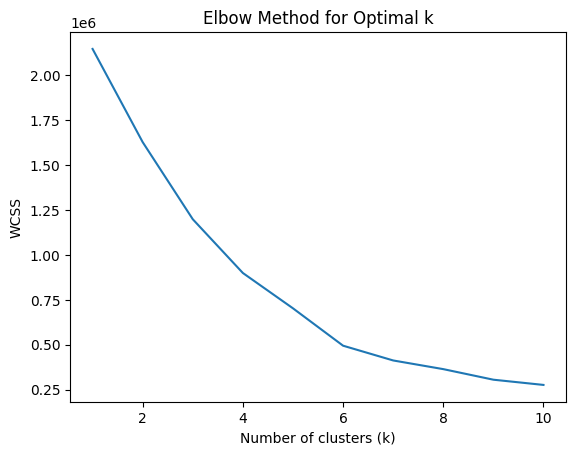

In [24]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Elbow Method to find the optimal k
wcss = []  # Within-cluster sum of squares
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(scaled_features)
    wcss.append(kmeans.inertia_)

# Plot the Elbow graph
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()


In [27]:
# Apply K-Means with the chosen number of clusters (let's assume k = 4 based on the elbow method)
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_features)

# Show the first 5 rows with the assigned cluster
df.head(100)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice,Year,Month,Day,Cluster
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01 08:26:00,2.55,17850.0,36,15.30,2010,12,1,1
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01 08:26:00,2.75,17850.0,36,22.00,2010,12,1,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01 08:26:00,3.39,17850.0,36,20.34,2010,12,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,536378,22352,LUNCH BOX WITH CUTLERY RETROSPOT,6.0,2010-12-01 09:37:00,2.55,14688.0,36,15.30,2010,12,1,1
96,536378,21212,PACK OF 72 RETROSPOT CAKE CASES,23.5,2010-12-01 09:37:00,0.42,14688.0,36,50.40,2010,12,1,0
97,536378,21975,PACK OF 60 DINOSAUR CAKE CASES,23.5,2010-12-01 09:37:00,0.55,14688.0,36,13.20,2010,12,1,0
98,536378,21977,PACK OF 60 PINK PAISLEY CAKE CASES,23.5,2010-12-01 09:37:00,0.55,14688.0,36,13.20,2010,12,1,0


## Visualize the Clusters

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


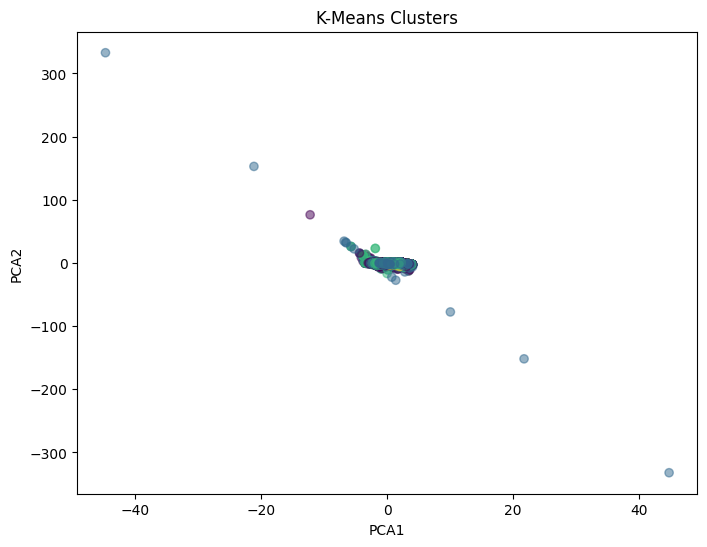

In [26]:
from sklearn.decomposition import PCA

# Reduce the features to 2D using PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_features)

# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=principal_components, columns=['PCA1', 'PCA2'])
pca_df['Cluster'] = df['Cluster']

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Cluster'], cmap='viridis', alpha=0.5)
plt.title('K-Means Clusters')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()


In [29]:
import plotly.express as px

# Assuming you have a DataFrame 'df' with the features, and the 'Cluster' labels are in the 'Cluster' column
# Choose 3 features for the 3D plot
features_3d = df[['Quantity', 'UnitPrice', 'TotalPrice']]  # Replace with your chosen features

# Extract the cluster labels
labels = df['Cluster']

# Create interactive 3D scatter plot
fig = px.scatter_3d(features_3d, x='Quantity', y='UnitPrice', z='TotalPrice', opacity=0.7, color=labels.astype(float))

# Update the plot aesthetics
fig.update_traces(marker=dict(size=5, line=dict(width=0.25)), showlegend=False)
fig.update_layout(coloraxis_showscale=False, width=1000, height=800, scene=dict(
        xaxis=dict(title='Quantity'),
        yaxis=dict(title='Unit Price'),
        zaxis=dict(title='Total Price')
    ))

# Show the plot
fig.show()


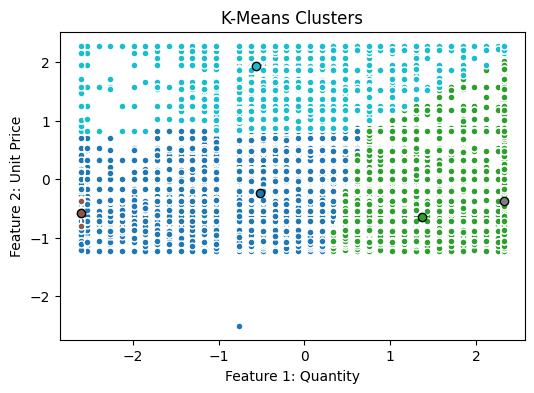

In [30]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler

# Select features (replace with your features of choice)
features = df[['Quantity', 'UnitPrice', 'TotalPrice']].dropna()  # Make sure no missing values
X = features.values  # Convert the dataframe to a NumPy array

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-Means Clustering
k_means3 = KMeans(init="k-means++", n_clusters=5, n_init=12)
k_means3.fit(X_scaled)

# Plot the clusters
fig = plt.figure(figsize=(6, 4))
colors = plt.cm.tab10(np.linspace(0, 1, len(set(k_means3.labels_))))
ax = fig.add_subplot(1, 1, 1)

# Plot each cluster
for k, col in zip(range(len(k_means3.cluster_centers_)), colors):
    my_members = (k_means3.labels_ == k)
    cluster_center = k_means3.cluster_centers_[k]
    ax.plot(X_scaled[my_members, 0], X_scaled[my_members, 1], 'w', markerfacecolor=col, marker='.', ms=10)
    ax.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=6)

plt.title("K-Means Clusters")
plt.xlabel('Feature 1: Quantity')
plt.ylabel('Feature 2: Unit Price')
plt.show()


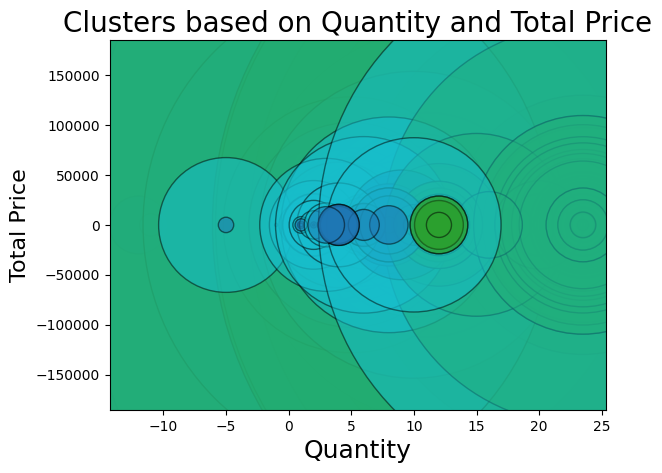

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'df' contains the necessary features and 'k_means3.labels_' holds the cluster labels

# Select features for plotting (use relevant features from your e-commerce dataset)
# X[:, 0] -> Quantity, X[:, 3] -> TotalPrice (or choose other features as needed)
X = df[['Quantity', 'UnitPrice', 'TotalPrice']].dropna().values  # Use relevant features
labels = k_means3.labels_

# Calculate the size of the points based on one of the features, e.g., 'TotalPrice' or 'Quantity'
area = np.pi * (X[:, 2])**2  # Using TotalPrice (X[:, 2]) to determine the size of points

# Plot
plt.scatter(X[:, 0], X[:, 2], s=area, c=labels.astype(float), cmap='tab10', edgecolors='k', alpha=0.5)

# Adding labels and title
plt.xlabel('Quantity', fontsize=18)
plt.ylabel('Total Price', fontsize=16)
plt.title('Clusters based on Quantity and Total Price', fontsize=20)

plt.show()

